# Football Data Analysis from 2013 to 2021 

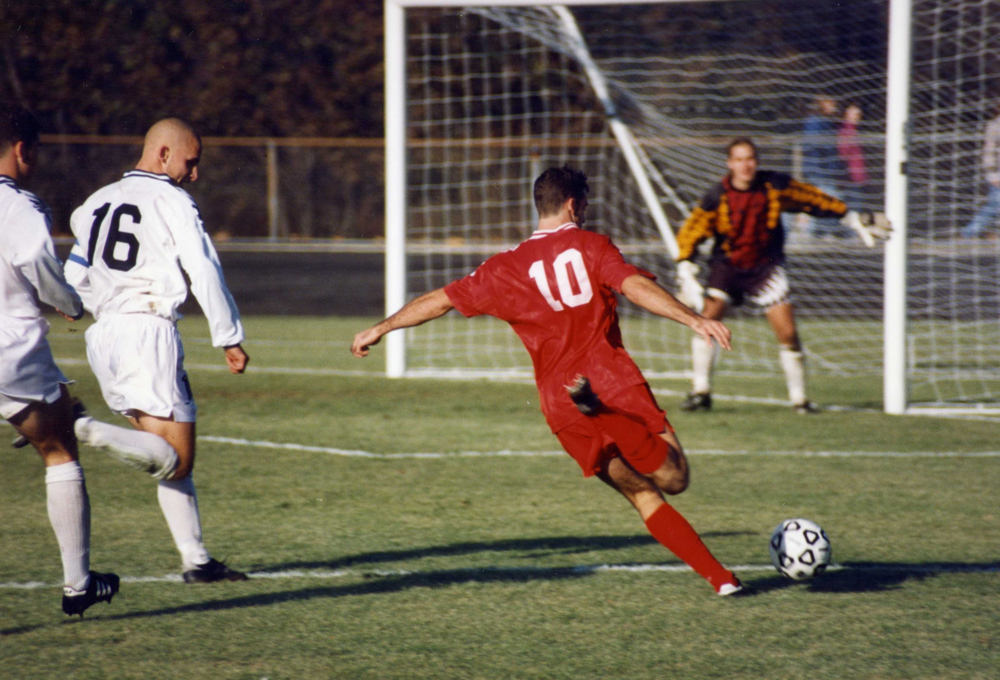

In [1]:
from IPython.display import Image
Image("Football.jpg")

##### Import basic libraries

In [2]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

## 2013 - 2014

In [3]:
#Read the dataset

data_2014 = pd.read_csv("2013-2014.csv")
data_2014.head()

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,BbMx>2.5,BbAv>2.5,BbMx<2.5,BbAv<2.5,BbAH,BbAHh,BbMxAHH,BbAvAHH,BbMxAHA,BbAvAHA
0,E0,17/08/13,Arsenal,Aston Villa,1,3,A,1,1,D,...,1.62,1.56,2.56,2.37,NaN,NaN,NaN,NaN,NaN,NaN
1,E0,17/08/13,Liverpool,Stoke,1,0,H,1,0,H,...,1.86,1.79,2.12,2.02,NaN,NaN,NaN,NaN,NaN,NaN
2,E0,17/08/13,Norwich,Everton,2,2,D,0,0,D,...,2.08,1.98,1.91,1.82,NaN,NaN,NaN,NaN,NaN,NaN
3,E0,17/08/13,Sunderland,Fulham,0,1,A,0,0,D,...,2.14,2.04,1.84,1.77,NaN,NaN,NaN,NaN,NaN,NaN
4,E0,17/08/13,Swansea,Man United,1,4,A,0,2,A,...,1.93,1.83,2.06,1.98,NaN,NaN,NaN,NaN,NaN,NaN


Div = League Division

Date = Match Date (dd/mm/yy)

HomeTeam = Home Team

AwayTeam = Away Team

FTHG = Full Time Home Team Goals

FTAG = Full Time Away Team Goals

FTR = Full Time Result (H=Home Win, D=Draw, A=Away Win)

In [4]:
data_2014.shape

(380, 65)

### Feature Selection

##### We need only important features

In [5]:
final_data_14 = data_2014[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_14.head()  #first 5 rows of dataset

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,17/08/13,Arsenal,Aston Villa,1,3,A
1,17/08/13,Liverpool,Stoke,1,0,H
2,17/08/13,Norwich,Everton,2,2,D
3,17/08/13,Sunderland,Fulham,0,1,A
4,17/08/13,Swansea,Man United,1,4,A


In [6]:
final_data_14.describe()    #statistical info. about numerical features of data

,FTHG,FTAG
count,380.000000,380.000000
mean,1.573684,1.194737
std,1.377291,1.202010
min,0.000000,0.000000
25%,0.750000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,7.000000,6.000000


#### Checking null values in data

In [7]:
final_data_14.isnull().sum()   #no null values in this dataset

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

### Now check Total Team numbers and their names

In [8]:
print("Total numbers of unique Hometeams in our data:\t",final_data_14.HomeTeam.nunique())
print("The names of Hometeams are:\n\n",final_data_14.HomeTeam.unique())

Total numbers of unique Hometeams in our data:	 20
The names of Hometeams are:

 ['Arsenal' 'Liverpool' 'Norwich' 'Sunderland' 'Swansea' 'West Brom'
 'West Ham' 'Chelsea' 'Crystal Palace' 'Man City' 'Aston Villa' 'Everton'
 'Fulham' 'Hull' 'Newcastle' 'Southampton' 'Stoke' 'Cardiff' 'Tottenham'
 'Man United']


In [9]:
print("Total numbers of unique Awayteams in our data:\t",final_data_14.AwayTeam.nunique())
print("The names of Awayteams are:\n\n",final_data_14.AwayTeam.unique())

Total numbers of unique Awayteams in our data:	 20
The names of Awayteams are:

 ['Aston Villa' 'Stoke' 'Everton' 'Fulham' 'Man United' 'Southampton'
 'Cardiff' 'Hull' 'Tottenham' 'Newcastle' 'Liverpool' 'West Brom'
 'Arsenal' 'Norwich' 'West Ham' 'Sunderland' 'Crystal Palace' 'Man City'
 'Swansea' 'Chelsea']


In [10]:
res = final_data_14['FTR'].value_counts().to_frame()
res

,FTR
H,179
A,123
D,78


Acording to data:

Home Team win 179 times.

Away team win 123 times.

And 78 times match is draw.

Text(0.5, 1.0, 'Overall results')

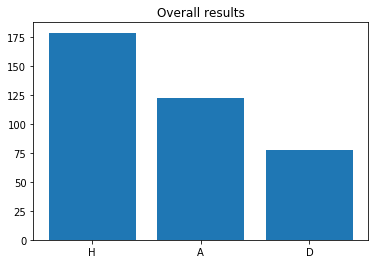

In [11]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [12]:
away_win = final_data_14[final_data_14['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

In [13]:
home_win = final_data_14[final_data_14['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

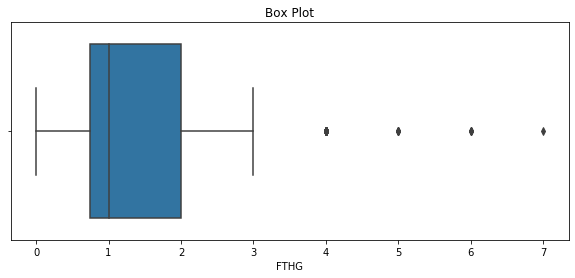

In [14]:
def Box_plots(df):
    plt.figure(figsize=(10, 4))
    plt.title("Box Plot")
    sns.boxplot(df)
    plt.show()

Box_plots(final_data_14['FTHG'])

#### Home team goals mostly are in between 0 to 3. 

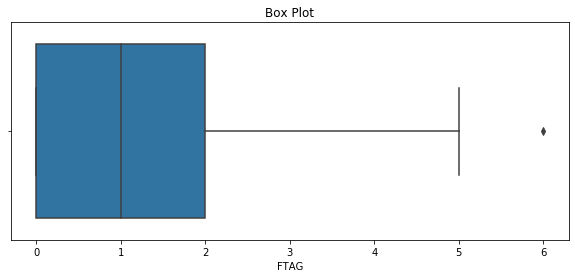

In [15]:
Box_plots(final_data_14['FTAG'])

#### Away team goals moslty are in between 0 to 5.

## 2014 - 2015

In [16]:
#Read the dataset

data_2015 = pd.read_csv("14_15.csv")
data_2015.head()

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,BbAv<2.5,BbAH,BbAHh,BbMxAHH,BbAvAHH,BbMxAHA,BbAvAHA,PSCH,PSCD,PSCA
0,E0,16-08-14,Arsenal,Crystal Palace,2,1,H,1,1,D,...,2.10,24,-1.50,1.81,1.78,2.20,2.10,1.29,5.90,12.75
1,E0,16-08-14,Leicester,Everton,2,2,D,1,2,A,...,1.80,22,0.25,1.88,1.85,2.10,2.02,3.11,3.40,2.47
2,E0,16-08-14,Man United,Swansea,1,2,A,0,1,A,...,2.13,25,-1.50,2.18,2.08,1.87,1.79,1.45,4.81,8.25
3,E0,16-08-14,QPR,Hull,0,1,A,0,0,D,...,1.58,24,0.00,1.80,1.73,2.25,2.14,2.31,3.24,3.59
4,E0,16-08-14,Stoke,Aston Villa,0,1,A,0,0,D,...,1.60,23,-0.50,1.95,1.91,2.02,1.96,2.01,3.34,4.51


In [17]:
data_2015.shape

(380, 68)

In [18]:
final_data_15 = data_2015[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_15.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,16-08-14,Arsenal,Crystal Palace,2,1,H
1,16-08-14,Leicester,Everton,2,2,D
2,16-08-14,Man United,Swansea,1,2,A
3,16-08-14,QPR,Hull,0,1,A
4,16-08-14,Stoke,Aston Villa,0,1,A


In [19]:
final_data_15.describe()    #statistical info. about numerical features of data

,FTHG,FTAG
count,380.000000,380.000000
mean,1.473684,1.092105
std,1.263175,1.069826
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,8.000000,6.000000


In [20]:
final_data_15.isnull().sum()

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

In [21]:
res = final_data_15['FTR'].value_counts().to_frame()
res

,FTR
H,172
A,115
D,93


Acording to data:

Home Team win 172 times.

Away team win 115 times.

And 93 times match is draw.

Text(0.5, 1.0, 'Overall results')

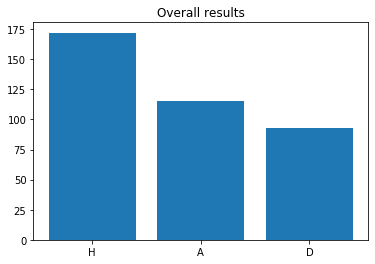

In [22]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [23]:
away_win = final_data_15[final_data_15['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

In [24]:
home_win = final_data_15[final_data_15['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

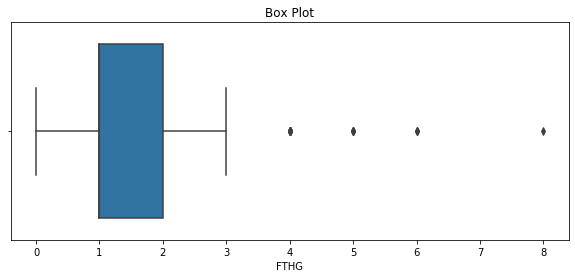

In [25]:
Box_plots(final_data_15['FTHG'])

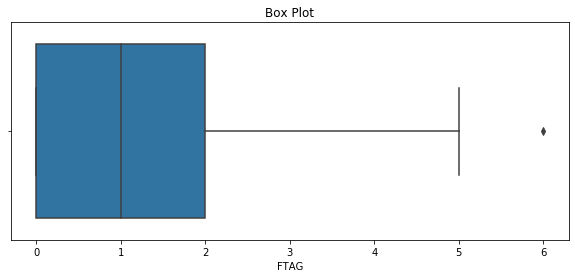

In [26]:
Box_plots(final_data_15['FTAG'])

## 2015 - 2016

In [27]:
#Read the dataset

data_2016 = pd.read_csv("15_16.csv")
data_2016.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Referee,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
0,8/8/15,Bournemouth,Aston Villa,0,1,A,0,0,D,M Clattenburg,...,2,3,13,13,6,3,3,4,0,0
1,8/8/15,Chelsea,Swansea,2,2,D,2,1,H,M Oliver,...,3,10,15,16,4,8,1,3,1,0
2,8/8/15,Everton,Watford,2,2,D,0,1,A,M Jones,...,5,5,7,13,8,2,1,2,0,0
3,8/8/15,Leicester,Sunderland,4,2,H,3,0,H,L Mason,...,8,5,13,17,6,3,2,4,0,0
4,8/8/15,Man United,Tottenham,1,0,H,1,0,H,J Moss,...,1,4,12,12,1,2,2,3,0,0


In [28]:
final_data_16 = data_2016[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_16.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,8/8/15,Bournemouth,Aston Villa,0,1,A
1,8/8/15,Chelsea,Swansea,2,2,D
2,8/8/15,Everton,Watford,2,2,D
3,8/8/15,Leicester,Sunderland,4,2,H
4,8/8/15,Man United,Tottenham,1,0,H


In [29]:
final_data_16.describe()

,FTHG,FTAG
count,380.000000,380.000000
mean,1.492105,1.207895
std,1.259242,1.146955
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,6.000000,6.000000


In [30]:
final_data_16.isnull().sum()

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

In [31]:
res = final_data_16['FTR'].value_counts().to_frame()
res

,FTR
H,157
A,116
D,107


Acording to data:

Home Team win 157 times.

Away team win 116 times.

And 107 times match is draw.

Text(0.5, 1.0, 'Overall results')

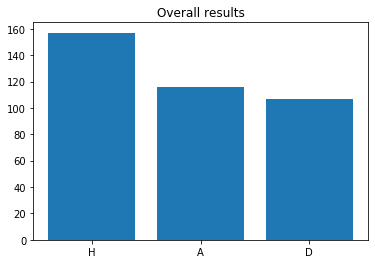

In [32]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [33]:
away_win = final_data_16[final_data_16['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

In [34]:
home_win = final_data_16[final_data_16['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

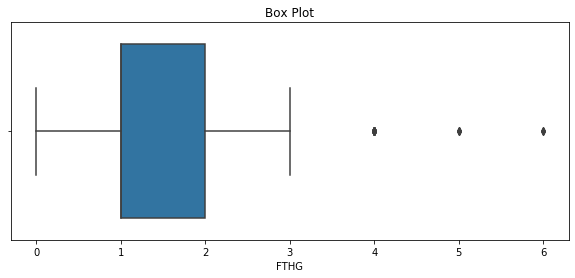

In [35]:
Box_plots(final_data_16['FTHG'])

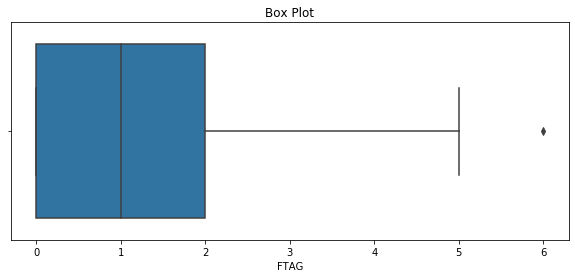

In [36]:
Box_plots(final_data_16['FTAG'])

## 2016 - 2017

In [37]:
#Read the dataset

data_2017 = pd.read_csv("16_17.csv")
data_2017.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Referee,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
0,13/08/16,Burnley,Swansea,0,1,A,0,0,D,J Moss,...,3,9,10,14,7,4,3,2,0,0
1,13/08/16,Crystal Palace,West Brom,0,1,A,0,0,D,C Pawson,...,4,3,12,15,3,6,2,2,0,0
2,13/08/16,Everton,Tottenham,1,1,D,1,0,H,M Atkinson,...,6,4,10,14,5,6,0,0,0,0
3,13/08/16,Hull,Leicester,2,1,H,1,0,H,M Dean,...,5,5,8,17,5,3,2,2,0,0
4,13/08/16,Man City,Sunderland,2,1,H,1,0,H,R Madley,...,4,3,11,14,9,6,1,2,0,0


In [38]:
final_data_17 = data_2017[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_17.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,13/08/16,Burnley,Swansea,0,1,A
1,13/08/16,Crystal Palace,West Brom,0,1,A
2,13/08/16,Everton,Tottenham,1,1,D
3,13/08/16,Hull,Leicester,2,1,H
4,13/08/16,Man City,Sunderland,2,1,H


In [39]:
final_data_17.describe()

,FTHG,FTAG
count,380.000000,380.000000
mean,1.597368,1.202632
std,1.306971,1.227862
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,6.000000,7.000000


In [40]:
final_data_17.isnull().sum()

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

In [41]:
res = final_data_17['FTR'].value_counts().to_frame()
res

,FTR
H,187
A,109
D,84


Home team wins 187 times.

Away team win 109 times.

84 times match was draw.

Text(0.5, 1.0, 'Overall results')

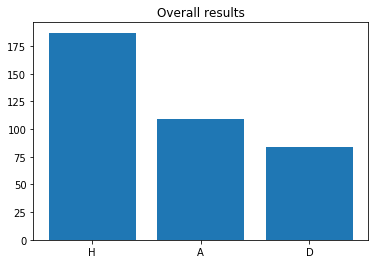

In [42]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [43]:
away_win = final_data_17[final_data_17['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

In [44]:
home_win = final_data_17[final_data_17['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

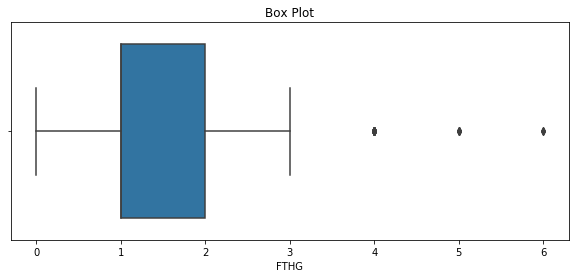

In [45]:
Box_plots(final_data_17['FTHG'])

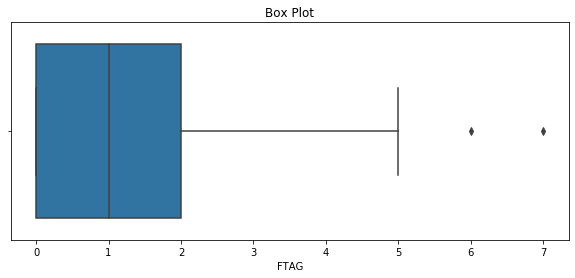

In [46]:
Box_plots(final_data_17['FTAG'])

## 2017 - 2018

In [47]:
#Read the dataset

data_2018 = pd.read_csv("2017-2018.csv")
data_2018.head()

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
0,E0,11/8/17,Arsenal,Leicester,4,3,H,2,2,D,...,10,3,9,12,9,4,0,1,0,0
1,E0,12/8/17,Brighton,Man City,0,2,A,0,0,D,...,2,4,6,9,3,10,0,2,0,0
2,E0,12/8/17,Chelsea,Burnley,2,3,A,0,3,A,...,6,5,16,11,8,5,3,3,2,0
3,E0,12/8/17,Crystal Palace,Huddersfield,0,3,A,0,2,A,...,4,6,7,19,12,9,1,3,0,0
4,E0,12/8/17,Everton,Stoke,1,0,H,1,0,H,...,4,1,13,10,6,7,1,1,0,0


In [48]:
final_data_18 = data_2018[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_18.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,11/8/17,Arsenal,Leicester,4,3,H
1,12/8/17,Brighton,Man City,0,2,A
2,12/8/17,Chelsea,Burnley,2,3,A
3,12/8/17,Crystal Palace,Huddersfield,0,3,A
4,12/8/17,Everton,Stoke,1,0,H


In [49]:
final_data_18.describe()

,FTHG,FTAG
count,380.000000,380.000000
mean,1.531579,1.147368
std,1.340087,1.177793
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,7.000000,6.000000


In [50]:
final_data_18.isnull().sum()

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

In [51]:
res = final_data_18['FTR'].value_counts().to_frame()
res

,FTR
H,173
A,108
D,99


Text(0.5, 1.0, 'Overall results')

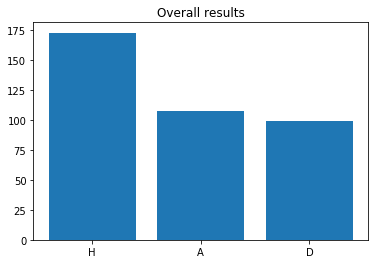

In [52]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [53]:
home_win = final_data_18[final_data_18['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

In [54]:
away_win = final_data_18[final_data_18['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

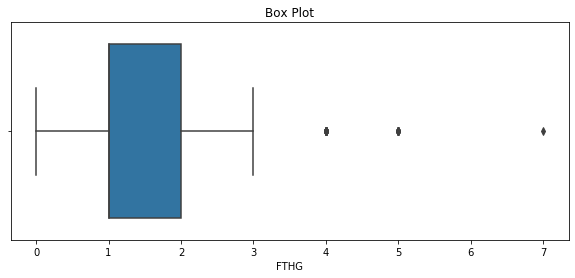

In [55]:
Box_plots(final_data_18['FTHG'])

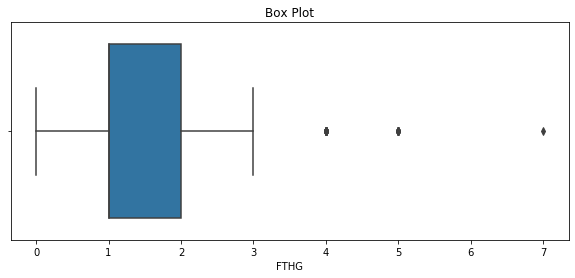

In [56]:
Box_plots(final_data_18['FTHG'])

## 2018 - 2019

In [57]:
#Read the dataset

data_2019 = pd.read_csv("2018-2019.csv")
data_2019.head()

,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
0,E0,10/8/18,Man United,Leicester,2,1,H,1,0,H,...,6,4,11,8,2,5,2,1,0,0
1,E0,11/8/18,Bournemouth,Cardiff,2,0,H,1,0,H,...,4,1,11,9,7,4,1,1,0,0
2,E0,11/8/18,Fulham,Crystal Palace,0,2,A,0,1,A,...,6,9,9,11,5,5,1,2,0,0
3,E0,11/8/18,Huddersfield,Chelsea,0,3,A,0,2,A,...,1,4,9,8,2,5,2,1,0,0
4,E0,11/8/18,Newcastle,Tottenham,1,2,A,1,2,A,...,2,5,11,12,3,5,2,2,0,0


In [58]:
final_data_19 = data_2019[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_19.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,10/8/18,Man United,Leicester,2,1,H
1,11/8/18,Bournemouth,Cardiff,2,0,H
2,11/8/18,Fulham,Crystal Palace,0,2,A
3,11/8/18,Huddersfield,Chelsea,0,3,A
4,11/8/18,Newcastle,Tottenham,1,2,A


In [59]:
final_data_19.describe()

,FTHG,FTAG
count,380.000000,380.000000
mean,1.568421,1.252632
std,1.312836,1.180031
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,6.000000,6.000000


In [60]:
final_data_19.isnull().sum()

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

In [61]:
res = final_data_19['FTR'].value_counts().to_frame()
res

,FTR
H,181
A,128
D,71


Text(0.5, 1.0, 'Overall results')

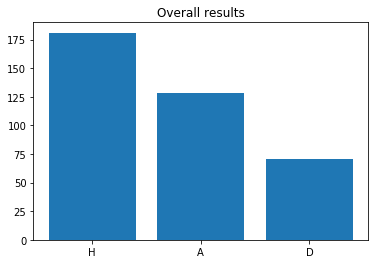

In [62]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [63]:
home_win = final_data_19[final_data_19['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

In [64]:
away_win = final_data_19[final_data_19['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

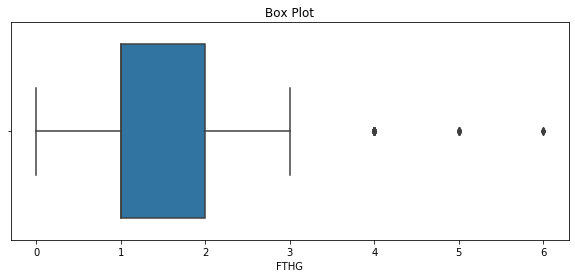

In [65]:
Box_plots(final_data_19['FTHG'])

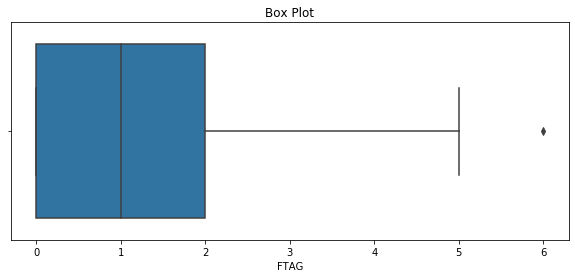

In [66]:
Box_plots(final_data_19['FTAG'])

## 2019 - 2020

In [67]:
#Read the dataset

data_2020 = pd.read_csv("19-20.csv")
data_2020.head()

,Div,Date,Time,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,...,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA
0,E0,09/08/2019,20:00,Liverpool,Norwich,4,1,H,4,0,...,3.43,-2.25,1.91,1.99,1.94,1.98,1.99,2.07,1.90,1.99
1,E0,10/08/2019,12:30,West Ham,Man City,0,5,A,0,1,...,2.91,1.75,1.95,1.95,1.96,1.97,2.07,1.98,1.97,1.92
2,E0,10/08/2019,15:00,Bournemouth,Sheffield United,1,1,D,0,0,...,1.92,-0.50,1.95,1.95,1.98,1.95,2.00,1.96,1.96,1.92
3,E0,10/08/2019,15:00,Burnley,Southampton,3,0,H,0,0,...,1.71,0.00,1.87,2.03,1.89,2.03,1.90,2.07,1.86,2.02
4,E0,10/08/2019,15:00,Crystal Palace,Everton,0,0,D,0,0,...,1.71,0.25,1.82,2.08,1.97,1.96,2.03,2.08,1.96,1.93


In [68]:
final_data_20 = data_2020[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_20.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,09/08/2019,Liverpool,Norwich,4,1,H
1,10/08/2019,West Ham,Man City,0,5,A
2,10/08/2019,Bournemouth,Sheffield United,1,1,D
3,10/08/2019,Burnley,Southampton,3,0,H
4,10/08/2019,Crystal Palace,Everton,0,0,D


In [69]:
final_data_20.describe()

,FTHG,FTAG
count,380.000000,380.000000
mean,1.515789,1.205263
std,1.248646,1.200252
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,8.000000,9.000000


In [70]:
final_data_20.isnull().sum()

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

In [71]:
res = final_data_20['FTR'].value_counts().to_frame()
res

,FTR
H,172
A,116
D,92


Text(0.5, 1.0, 'Overall results')

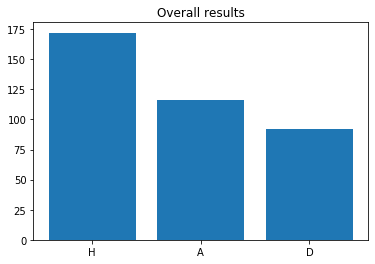

In [72]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [73]:
home_win = final_data_20[final_data_20['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

In [74]:
away_win = final_data_20[final_data_20['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

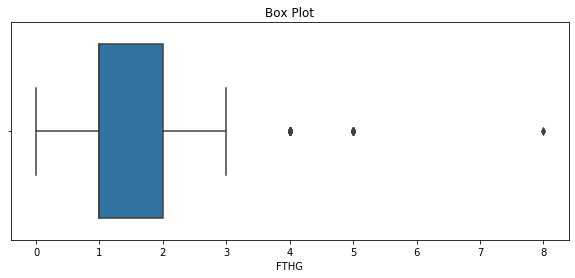

In [75]:
Box_plots(final_data_20['FTHG'])

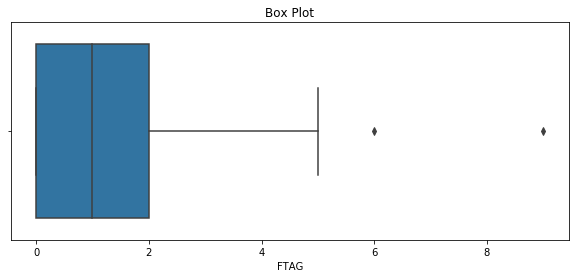

In [76]:
Box_plots(final_data_20['FTAG'])

## 2020 - 2021

In [77]:
#Read the dataset

data_2021 = pd.read_excel("all-euro-data-2020-2021.xlsx")
data_2021.head()

,Div,Date,Time,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,...,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA
0,E0,2020-09-12,12:30:00,Fulham,Arsenal,0,3,A,0,1,...,1.84,0.75,2.01,1.89,2.02,1.91,2.13,1.92,2.02,1.87
1,E0,2020-09-12,15:00:00,Crystal Palace,Southampton,1,0,H,1,0,...,1.70,0.25,1.78,2.13,1.79,2.17,1.85,2.18,1.79,2.12
2,E0,2020-09-12,17:30:00,Liverpool,Leeds,4,3,H,3,2,...,2.62,-1.50,1.85,2.05,1.85,2.08,1.90,2.16,1.84,2.04
3,E0,2020-09-12,20:00:00,West Ham,Newcastle,0,2,A,0,0,...,1.92,-0.50,2.03,1.87,2.04,1.88,2.09,1.91,2.02,1.86
4,E0,2020-09-13,14:00:00,West Brom,Leicester,0,3,A,0,0,...,1.73,0.25,1.92,1.98,1.93,1.99,1.95,2.01,1.91,1.97


In [78]:
final_data_21 = data_2021[["Date", "HomeTeam", "AwayTeam", "FTHG", "FTAG", "FTR"]]    #Select only useful features
final_data_21.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR
0,2020-09-12,Fulham,Arsenal,0,3,A
1,2020-09-12,Crystal Palace,Southampton,1,0,H
2,2020-09-12,Liverpool,Leeds,4,3,H
3,2020-09-12,West Ham,Newcastle,0,2,A
4,2020-09-13,West Brom,Leicester,0,3,A


In [79]:
final_data_21.describe()

,FTHG,FTAG
count,380.000000,380.000000
mean,1.352632,1.342105
std,1.320378,1.257722
min,0.000000,0.000000
25%,0.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,9.000000,7.000000


In [80]:
final_data_21.isnull().sum()

Date        0
HomeTeam    0
AwayTeam    0
FTHG        0
FTAG        0
FTR         0
dtype: int64

In [81]:
res = final_data_21['FTR'].value_counts().to_frame()
res

,FTR
A,153
H,144
D,83


Text(0.5, 1.0, 'Overall results')

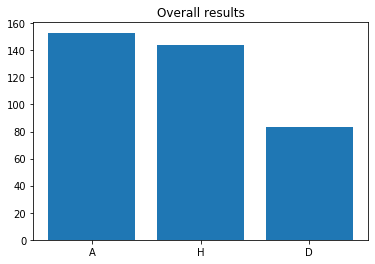

In [82]:
plt.bar(res.index, res['FTR'])
plt.title("Overall results")

In [83]:
home_win = final_data_21[final_data_21['FTR'] == 'H' ]
home_win_plot = away_win['HomeTeam'].value_counts().nlargest(10).to_frame()
px.bar(home_win_plot, x=home_win_plot.index, y= home_win_plot['HomeTeam'], title="Top 10 HomeTeams in wining list", color=home_win_plot.index)

In [84]:
away_win = final_data_21[final_data_21['FTR'] == 'A' ]
away_win_plot = away_win['AwayTeam'].value_counts().nlargest(10).to_frame()
px.bar(away_win_plot, x=away_win_plot.index, y= away_win_plot['AwayTeam'], title="Top 10 AwayTeams in wining list", color=away_win_plot.index)

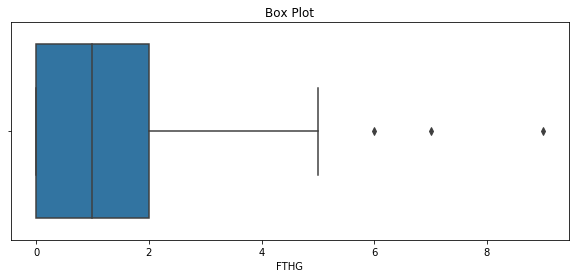

In [85]:
Box_plots(final_data_21['FTHG'])

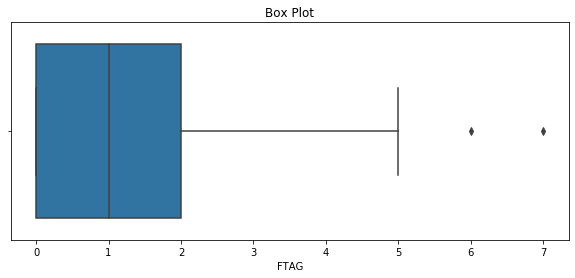

In [86]:
Box_plots(final_data_21['FTAG'])